**Predicting CO2 Emissions**

The ability to accurately monitor carbon emissions is a critical step in the fight against climate change. Precise carbon readings allow researchers and governments to understand the sources and patterns of carbon mass output. While Europe and North America have extensive systems in place to monitor carbon emissions on the ground, there are few available in Africa.

The objective of this exercise is to create a machine learning models using open-source CO2 emissions data from Sentinel-5P satellite observations to predict future carbon emissions.

These solutions may help enable governments, and other actors to estimate carbon emission levels across Africa, even in places where on-the-ground monitoring is not possible.

**Acknowledgements**

We acknowledge Carbon Monitor for the use of the GRACED dataset, and special thanks Darius Moruri from Zindi for his work in preparing the dataset and starter notebooks

In [49]:
import numpy as np
import pandas as pd
import os
import re
import copy
import pickle
from sklearn.base import clone
from sklearn.metrics import cohen_kappa_score
from sklearn.model_selection import StratifiedKFold
from scipy.optimize import minimize
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, FormatStrFormatter, PercentFormatter
import seaborn as sns

from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from keras.models import Model
from keras.layers import Input, Dense
from keras.optimizers import Adam
# import torch
# import torch.nn as nn
# import torch.optim as optim

from colorama import Fore, Style
from IPython.display import clear_output
import warnings
# from lightgbm import LGBMRegressor
# from xgboost import XGBRegressor
from sklearn.ensemble import VotingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.pipeline import Pipeline

import plotly.express as px

from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm

# import geopandas as gpd
# from shapely.geometry import Point
# import folium

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor

from sklearn.metrics import mean_squared_error
pd.options.display.float_format = '{:.5f}'.format
pd.options.display.max_rows = None
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')


```markdown
## Data Cleaning and Transformation

The following section will include data cleaning and transforming of the data shape.
```

In [50]:
# Load the Data
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

In [51]:

train_df.head()
train_df.shape, test_df.shape

((79023, 76), (24353, 75))

In [52]:
# Check basic information of the datasets
print("Train Data Info:")
train_df.info()

print("\nTest Data Info:")
test_df.info()

# Check for missing values in both datasets
print("\nMissing Values in Train Data:")
print(train_df.isnull().sum())

print("\nMissing Values in Test Data:")
print(test_df.isnull().sum())


Train Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79023 entries, 0 to 79022
Data columns (total 76 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   ID_LAT_LON_YEAR_WEEK                                      79023 non-null  object 
 1   latitude                                                  79023 non-null  float64
 2   longitude                                                 79023 non-null  float64
 3   year                                                      79023 non-null  int64  
 4   week_no                                                   79023 non-null  int64  
 5   SulphurDioxide_SO2_column_number_density                  64414 non-null  float64
 6   SulphurDioxide_SO2_column_number_density_amf              64414 non-null  float64
 7   SulphurDioxide_SO2_slant_column_number_density            64414 non-null  float64
 8  

In [53]:
total_missing = train_df.isnull().sum().sum()
total_entries = train_df.size
overall_missing_percentage = (total_missing / total_entries) * 100
overall_missing_percentage

16.4857233437034

In [54]:
# Statistical summary of numerical features
print("Train Data Statistics:")
display(train_df.describe())

print("\nTest Data Statistics:")
display(test_df.describe())


Train Data Statistics:


,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,UvAerosolLayerHeight_aerosol_height,UvAerosolLayerHeight_aerosol_pressure,UvAerosolLayerHeight_aerosol_optical_depth,UvAerosolLayerHeight_sensor_zenith_angle,UvAerosolLayerHeight_sensor_azimuth_angle,UvAerosolLayerHeight_solar_azimuth_angle,UvAerosolLayerHeight_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
count,79023.00000,79023.00000,79023.00000,79023.00000,64414.00000,64414.00000,64414.00000,64414.00000,64414.00000,64414.00000,64414.00000,64414.00000,64414.00000,76901.00000,76901.00000,76901.00000,76901.00000,76901.00000,76901.00000,76901.00000,76901.00000,60703.00000,60703.00000,60703.00000,60703.00000,60703.00000,60703.00000,60703.00000,60703.00000,60703.00000,60703.00000,60703.00000,60703.00000,71746.00000,71746.00000,71746.00000,71746.00000,71746.00000,71746.00000,71746.00000,71746.00000,78484.00000,78484.00000,78484.00000,78484.00000,78484.00000,78484.00000,78475.00000,78475.00000,78475.00000,78475.00000,78475.00000,78475.00000,78475.00000,78475.00000,78475.00000,439.00000,439.00000,439.00000,439.00000,439.00000,439.00000,439.00000,78539.00000,78539.00000,78539.00000,78539.00000,78539.00000,78539.00000,78539.00000,78539.00000,78539.00000,78539.00000,78539.00000,79023.00000
mean,-1.89107,29.88015,2020.00000,26.00000,0.00005,0.83485,0.00004,0.15842,-7.92587,37.43619,-83.83317,27.72231,0.00001,0.03316,2113.90623,2821.59072,829938.63376,-7.33105,37.84679,-86.04958,27.76702,0.00004,0.00001,0.00003,0.00010,8922.56899,-1.81216,0.09701,829994.22447,-15.93770,36.85264,-84.26008,28.31639,0.00013,1.25413,0.00008,0.22880,27.88781,-84.60584,40.47806,-9.39609,-1.34279,829974.54210,-12.74000,39.96288,-86.54890,28.05255,0.11734,2.60989,0.31080,228.62592,0.56911,-13.10880,39.80740,-86.52941,28.10402,3582.97124,66718.98129,0.73254,30.47448,45.26789,-70.81972,27.17266,0.59747,53086.83577,5592.3774


Test Data Statistics:


,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,UvAerosolLayerHeight_aerosol_height,UvAerosolLayerHeight_aerosol_pressure,UvAerosolLayerHeight_aerosol_optical_depth,UvAerosolLayerHeight_sensor_zenith_angle,UvAerosolLayerHeight_sensor_azimuth_angle,UvAerosolLayerHeight_solar_azimuth_angle,UvAerosolLayerHeight_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle
count,24353.00000,24353.00000,24353.00000,24353.00000,18211.00000,18211.00000,18211.00000,18211.00000,18211.00000,18211.00000,18211.00000,18211.00000,18211.00000,23016.00000,23016.00000,23016.00000,23016.00000,23016.00000,23016.00000,23016.00000,23016.00000,18698.00000,18698.00000,18698.00000,18698.00000,18698.00000,18698.00000,18698.00000,18698.00000,18698.00000,18698.00000,18698.00000,18698.00000,20960.00000,20960.00000,20960.00000,20960.00000,20960.00000,20960.00000,20960.00000,20960.00000,24206.00000,24206.00000,24206.00000,24206.00000,24206.00000,24206.00000,24206.00000,24206.00000,24206.00000,24206.00000,24206.00000,24206.00000,24206.00000,24206.00000,24206.00000,2093.00000,2093.00000,2093.00000,2093.00000,2093.00000,2093.00000,2093.00000,24187.00000,24187.00000,24187.00000,24187.00000,24187.00000,24187.00000,24187.00000,24187.00000,24187.00000,24187.00000,24187.00000
mean,-1.89107,29.88015,2022.00000,24.00000,0.00001,0.79257,0.00001,0.13922,9.29805,36.17431,-78.77412,25.94328,0.00000,0.03286,1800.86915,2689.93976,829928.48635,-4.08886,36.48552,-80.50784,27.16638,0.00005,0.00001,0.00004,0.00011,9147.26206,-0.92508,0.08978,829971.73815,-8.97253,35.67379,-78.22796,27.45898,0.00013,1.22330,0.00009,0.22165,26.51410,-79.83390,38.84476,3.27201,-0.74258,829974.04840,-14.55386,39.57108,-82.35189,27.84996,0.11939,2.60458,0.31558,230.47078,0.61879,-13.72013,39.61500,-82.41440,27.82868,2877.42376,72816.82014,1.49231,30.74827,18.19922,-73.67109,26.10885,0.66819,52291.36982,5850.56088,58914.75064,487

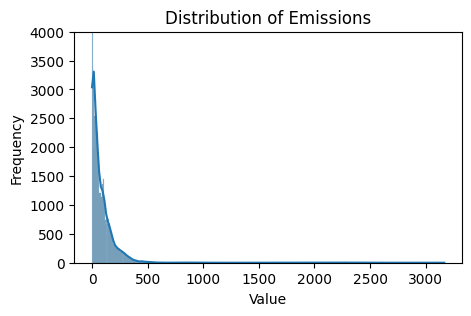

Skew:  10.173825825101622


In [55]:
# Let's check out the distribution of the data 
plt.figure(figsize=(5, 3))
sns.histplot(train_df['emission'], kde=True)
plt.title('Distribution of Emissions')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.ylim(0, 4000) 
plt.show()

print('Skew: ', train_df['emission'].skew()) # skewed to the right - we'll figure out how to handle this (if needed) while building our model

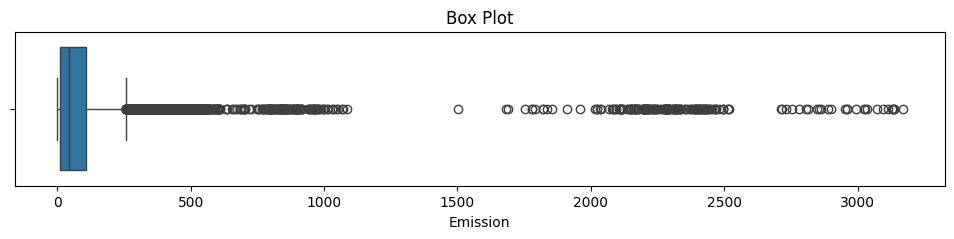

In [56]:
plt.figure(figsize=(12, 2))
sns.boxplot(x=train_df['emission'])
plt.title('Box Plot')
plt.xlabel('Emission')
plt.show()

# most of the emissions are below 500

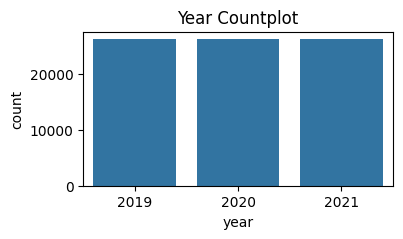

In [57]:
#now let's analyse this data as a timeseries

plt.figure(figsize=(4,2))
sns.countplot(x='year', data=train_df)
plt.title('Year Countplot')
plt.show()


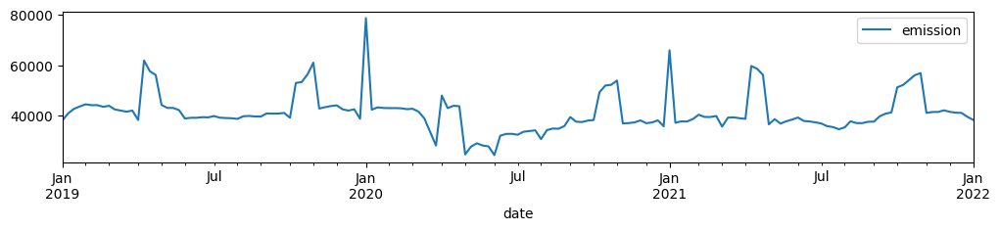

In [58]:
train_df['date'] = pd.to_datetime(train_df['year'].astype(str) + train_df['week_no'].astype(str) + '0', format='%Y%W%w')
weekly_emissions = train_df.groupby(['date'])[['emission']].sum()
weekly_emissions.plot(figsize=(12,2))
plt.show()

In [59]:
# List all columns in the train and test datasets
print("Train Data Columns:")
print(train_df.columns)

print("\nTest Data Columns:")
print(test_df.columns)

# 'CO2 Emissions' is the target
target_column = 'emission'  # Target column
feature_columns = [col for col in train_df.columns if col != target_column]

print("\nTarget Column:")
print(target_column)

print("\nFeature Columns:")
print(feature_columns)


Train Data Columns:
Index(['ID_LAT_LON_YEAR_WEEK', 'latitude', 'longitude', 'year', 'week_no', 'SulphurDioxide_SO2_column_number_density', 'SulphurDioxide_SO2_column_number_density_amf', 'SulphurDioxide_SO2_slant_column_number_density', 'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle', 'SulphurDioxide_sensor_zenith_angle', 'SulphurDioxide_solar_azimuth_angle', 'SulphurDioxide_solar_zenith_angle', 'SulphurDioxide_SO2_column_number_density_15km', 'CarbonMonoxide_CO_column_number_density', 'CarbonMonoxide_H2O_column_number_density', 'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_altitude', 'CarbonMonoxide_sensor_azimuth_angle', 'CarbonMonoxide_sensor_zenith_angle', 'CarbonMonoxide_solar_azimuth_angle', 'CarbonMonoxide_solar_zenith_angle', 'NitrogenDioxide_NO2_column_number_density', 'NitrogenDioxide_tropospheric_NO2_column_number_density', 'NitrogenDioxide_stratospheric_NO2_column_number_density', 'NitrogenDioxide_NO2_slant_column_number_density',
       'Nitr

Columns in train_df: Index(['ID_LAT_LON_YEAR_WEEK', 'latitude', 'longitude', 'year', 'week_no', 'SulphurDioxide_SO2_column_number_density', 'SulphurDioxide_SO2_column_number_density_amf', 'SulphurDioxide_SO2_slant_column_number_density', 'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle', 'SulphurDioxide_sensor_zenith_angle', 'SulphurDioxide_solar_azimuth_angle', 'SulphurDioxide_solar_zenith_angle', 'SulphurDioxide_SO2_column_number_density_15km', 'CarbonMonoxide_CO_column_number_density', 'CarbonMonoxide_H2O_column_number_density', 'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_altitude', 'CarbonMonoxide_sensor_azimuth_angle', 'CarbonMonoxide_sensor_zenith_angle', 'CarbonMonoxide_solar_azimuth_angle', 'CarbonMonoxide_solar_zenith_angle', 'NitrogenDioxide_NO2_column_number_density', 'NitrogenDioxide_tropospheric_NO2_column_number_density', 'NitrogenDioxide_stratospheric_NO2_column_number_density', 'NitrogenDioxide_NO2_slant_column_number_density',
       'Nit

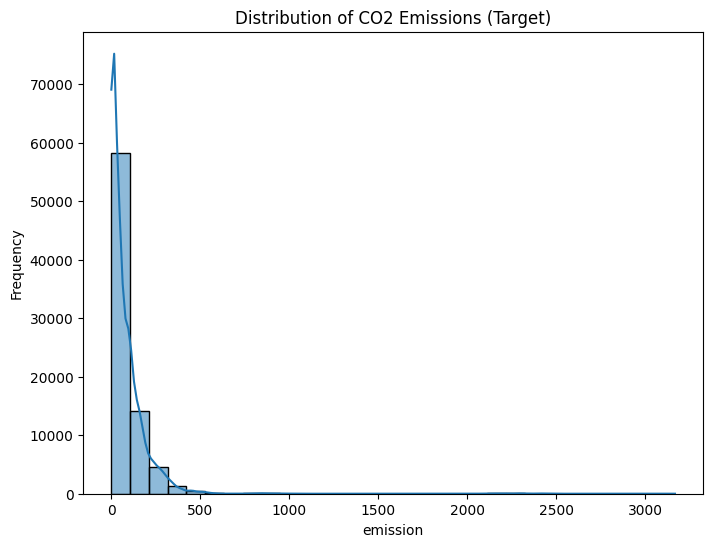

In [60]:
# Check the column names to ensure the target column exists
print("Columns in train_df:", train_df.columns)

# Verify the target column name
if target_column not in train_df.columns:
	print(f"Error: '{target_column}' column not found in train_df")
else:
	# Plot the distribution of the target variable
	plt.figure(figsize=(8, 6))
	sns.histplot(train_df[target_column], kde=True, bins=30)
	plt.title("Distribution of CO2 Emissions (Target)")
	plt.xlabel('emission')
	plt.ylabel("Frequency")
	plt.show()


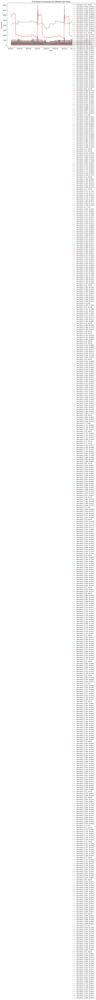

In [61]:
# Assuming 'latitude' and 'longitude' are the columns representing different geographical points
geo_points = train_df[['latitude', 'longitude']].drop_duplicates()

plt.figure(figsize=(12, 6))

for _, geo_point in geo_points.iterrows():
    geo_data = train_df[(train_df['latitude'] == geo_point['latitude']) & (train_df['longitude'] == geo_point['longitude'])]
    geo_data = geo_data.groupby('date')['emission'].sum()
    plt.plot(geo_data.index, geo_data.values, label=f'Geo Point ({geo_point["latitude"]}, {geo_point["longitude"]})')

plt.title('Time Series of Emissions for Different Geo Points')
plt.xlabel('Date')
plt.ylabel('Emissions')
plt.legend()
plt.show()

                                                    latitude  longitude     year  week_no  SulphurDioxide_SO2_column_number_density  SulphurDioxide_SO2_column_number_density_amf  SulphurDioxide_SO2_slant_column_number_density  SulphurDioxide_cloud_fraction  SulphurDioxide_sensor_azimuth_angle  SulphurDioxide_sensor_zenith_angle  SulphurDioxide_solar_azimuth_angle  SulphurDioxide_solar_zenith_angle  SulphurDioxide_SO2_column_number_density_15km  CarbonMonoxide_CO_column_number_density  CarbonMonoxide_H2O_column_number_density  CarbonMonoxide_cloud_height  CarbonMonoxide_sensor_altitude  CarbonMonoxide_sensor_azimuth_angle  CarbonMonoxide_sensor_zenith_angle  CarbonMonoxide_solar_azimuth_angle  CarbonMonoxide_solar_zenith_angle  NitrogenDioxide_NO2_column_number_density  NitrogenDioxide_tropospheric_NO2_column_number_density  NitrogenDioxide_stratospheric_NO2_column_number_density  NitrogenDioxide_NO2_slant_column_number_density  NitrogenDioxide_tropopause_pressure  \
latitude           

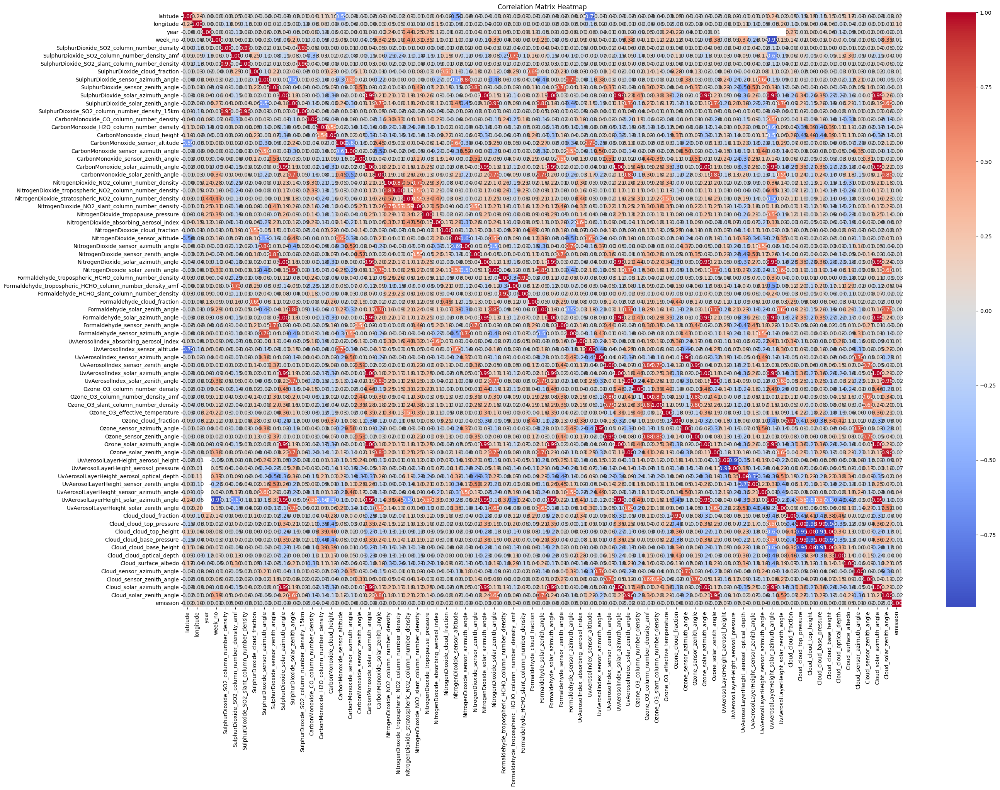

In [62]:
# Select only numeric columns
numeric_data = train_df.select_dtypes(include=[np.number])

# Calculate correlation
correlation_matrix = numeric_data.corr()
print(correlation_matrix)

# Optionally, you can visualize the correlation matrix using a heatmap
plt.figure(figsize=(30, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()

In [63]:
# # Select only numeric columns
# numeric_data = train_df.select_dtypes(include=[np.number])

# # Calculate correlation
# correlation_matrix = numeric_data.corr()

# Extract correlation values of all features with the target variable
target_column = 'emission'  # Correct target column name
correlation_with_target = correlation_matrix[target_column].sort_values(ascending=False)

# Display the most correlated features
print("Features Correlated with Target (CO2 Emissions):")
print(correlation_with_target)

# Define a correlation threshold to select features (e.g., 0.3 or higher)
correlation_threshold = 0.3
selected_features = correlation_with_target[correlation_with_target.abs() > correlation_threshold].index.tolist()

# # Remove the target column from the list of selected features
# if target_column in selected_features:
#     selected_features.remove(target_column)

# # Debugging: Check if selected_features is empty and print a message
# if not selected_features:
#     print("\nNo features meet the correlation threshold. Consider lowering the threshold or investigating the data.")

# print("\nSelected Features Based on Correlation Threshold:")
print(selected_features)


Features Correlated with Target (CO2 Emissions):
emission                                                    1.00000
longitude                                                   0.10275
UvAerosolLayerHeight_aerosol_height                         0.06901
Cloud_surface_albedo                                        0.04659
Formaldehyde_tropospheric_HCHO_column_number_density_amf    0.04026
UvAerosolLayerHeight_aerosol_optical_depth                  0.04016
UvAerosolLayerHeight_sensor_azimuth_angle                   0.03514
NitrogenDioxide_sensor_altitude                             0.02754
NitrogenDioxide_cloud_fraction                              0.02246
NitrogenDioxide_absorbing_aerosol_index                     0.02091
latitude                                                    0.01785
Ozone_O3_column_number_density                              0.01381
UvAerosolIndex_sensor_azimuth_angle                         0.00830
Ozone_sensor_azimuth_angle                                  0.00777

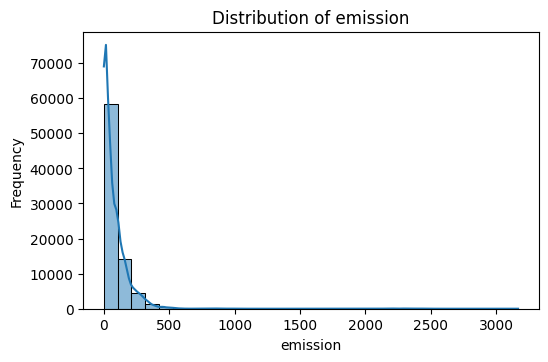

In [64]:
# Plot the distribution of each selected feature
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 10))
for i, feature in enumerate(selected_features, 1):
    plt.subplot(3, 3, i)  # Adjust grid size based on the number of features
    sns.histplot(train_df[feature], kde=True, bins=30)
    plt.title(f"Distribution of {feature}")
    plt.xlabel(feature)
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.impute import SimpleImputer

# Separate numerical and categorical columns
numerical_columns = train_df.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_columns = train_df.select_dtypes(include=['object']).columns.tolist()

# Impute missing values for numerical columns using mean strategy
numeric_imputer = SimpleImputer(strategy='mean')
train_df[numerical_columns] = numeric_imputer.fit_transform(train_df[numerical_columns])
test_df[numerical_columns] = numeric_imputer.transform(test_df[numerical_columns])

# If there are categorical columns, handle missing values (if any exist)
if categorical_columns:
    categorical_imputer = SimpleImputer(strategy='most_frequent')
    train_df[categorical_columns] = categorical_imputer.fit_transform(train_df[categorical_columns])
    test_df[categorical_columns] = categorical_imputer.transform(test_df[categorical_columns])

print("Missing values handled.")


In [ ]:
import pandas as pd

# Ensure required columns are present
required_columns = ['year', 'week_no', 'latitude', 'longitude']
for col in required_columns:
    if col not in train_df.columns:
        raise KeyError(f"'{col}' column is missing from train_df")
    if col not in test_df.columns:
        raise KeyError(f"'{col}' column is missing from test_df")

# Aggregation example: Weekly averages (ensure there's a relevant grouping key like 'latitude', 'longitude', 'year', and 'week_no')
train_df['weekly_avg_emission'] = train_df.groupby(['latitude', 'longitude', 'year', 'week_no'])['emission'].transform('mean')
test_df['weekly_avg_emission'] = test_df.groupby(['latitude', 'longitude', 'year', 'week_no'])['emission'].transform('mean')

# Handle missing values in test_df
test_df['weekly_avg_emission'].fillna(0, inplace=True)

print("Weekly averages added.")

Weekly averages added.


In [ ]:
from sklearn.preprocessing import StandardScaler

# Normalize numerical features
scaler = StandardScaler()
train_df[numerical_columns] = scaler.fit_transform(train_df[numerical_columns])
test_df[numerical_columns] = scaler.transform(test_df[numerical_columns])

print("Numerical features normalized.")


Numerical features normalized.


In [30]:
from sklearn.preprocessing import LabelEncoder

# Encode categorical columns using Label Encoding (for simplicity)
if categorical_columns:
    label_encoder = LabelEncoder()
    for col in categorical_columns:
        # Fit the label encoder on the train data
        train_df[col] = label_encoder.fit_transform(train_df[col])
        
        # Transform the test data, handling unseen labels
        test_df[col] = test_df[col].apply(lambda x: label_encoder.transform([x])[0] if x in label_encoder.classes_ else -1)
    
    print("Categorical variables encoded.")

Categorical variables encoded.


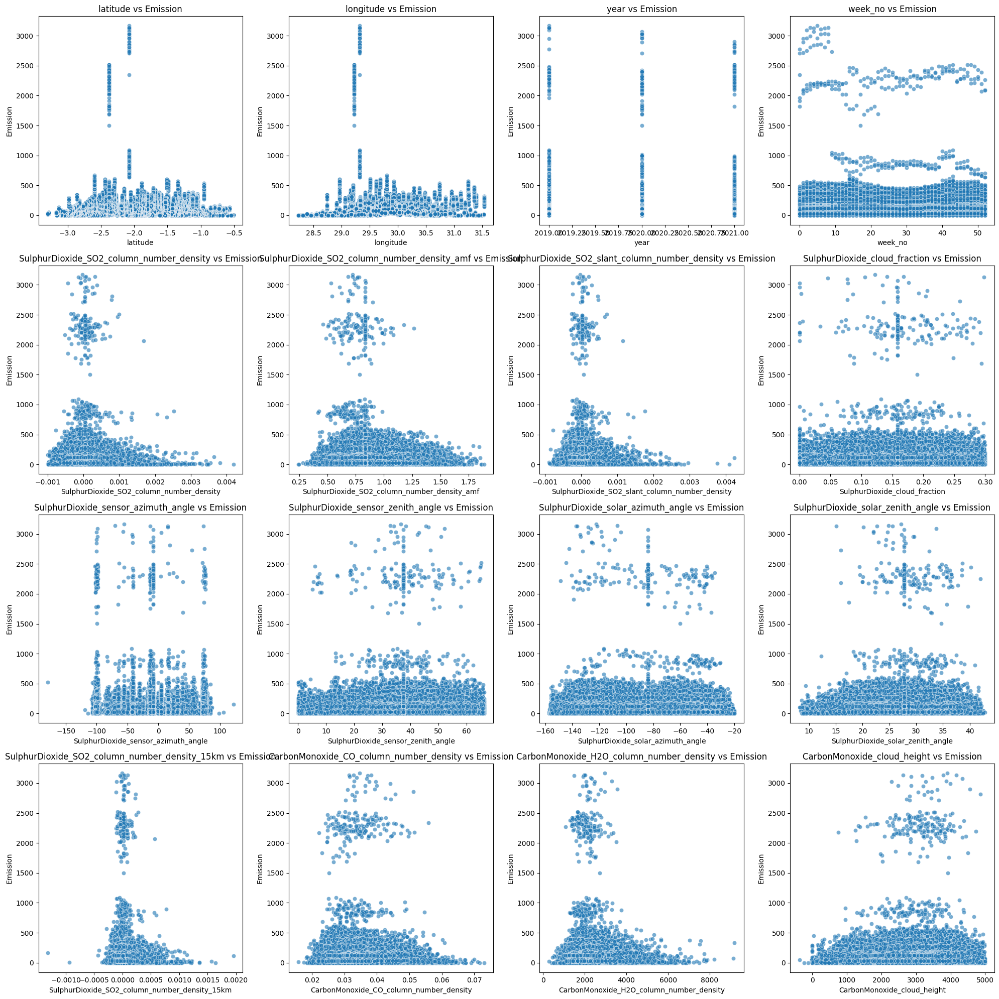

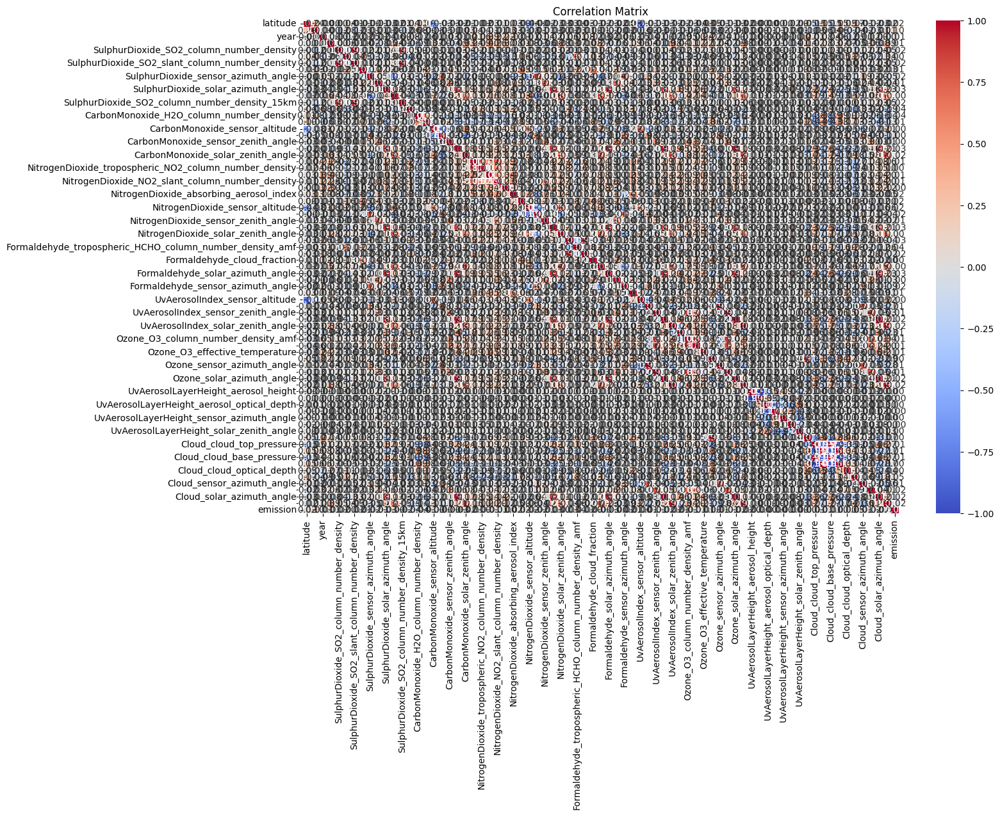

In [ ]:
# Extract numeric columns excluding categorical and non-predictor columns
numeric_columns = [
    col for col in train_df.columns 
    if train_df[col].dtype in ['float64', 'int64'] and col != 'emission'
]

# Plot scatter plots for all numerical features vs the "emission" column
plt.figure(figsize=(20, 20))  # Adjust figure size to avoid clutter

for i, feature in enumerate(numeric_columns[:16], 1):  # Show first 16 features
    plt.subplot(4, 4, i)  # 4x4 grid for scatter plots
    sns.scatterplot(x=train_df[feature], y=train_df['emission'], alpha=0.6)
    plt.title(f"{feature} vs Emission")
    plt.xlabel(feature)
    plt.ylabel("Emission")

plt.tight_layout()
plt.show()


corr_matrix=train_df[numeric_columns + ['emission']].corr()
plt.figure(figsize=(15,10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

# # Heatmap for correlation between numeric features and the target column "emission"
# plt.figure(figsize=(15, 10))
# corr_matrix = train_df[numeric_columns + ['emission']].corr()
# sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
# plt.title("Correlation Heatmap of Features and Emission")
# plt.show()


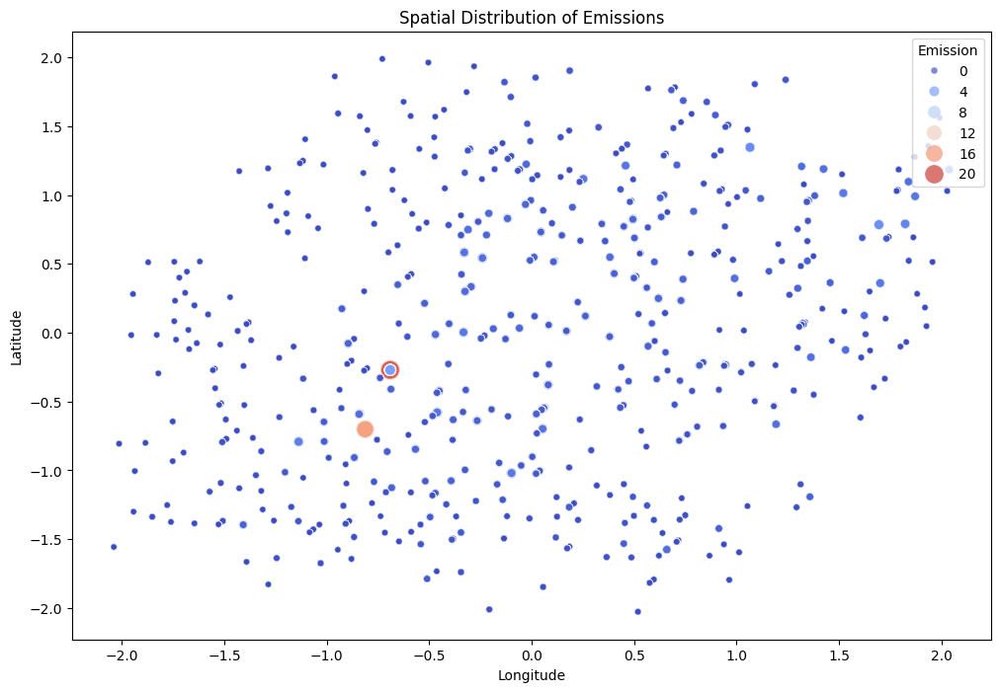

In [35]:
# Spatial analysis using latitude, longitude, and emission
if 'latitude' in train_df.columns and 'longitude' in train_df.columns:
    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        x=train_df['longitude'], 
        y=train_df['latitude'], 
        hue=train_df['emission'], 
        palette='coolwarm', 
        size=train_df['emission'], 
        sizes=(20, 200), 
        alpha=0.7
    )
    plt.title("Spatial Distribution of Emissions")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend(title="Emission", loc='upper right')
    plt.show()
else:
    print("Latitude and Longitude columns are missing. Skipping spatial analysis.")


In [77]:
# Drop the ID_LAT_LON_YEAR_WEEK and datetime-related columns
X_train = train_df.drop(columns=["emission", "ID_LAT_LON_YEAR_WEEK"])  # Adjust based on actual column names
y_train = train_df["emission"]

In [78]:
from sklearn.model_selection import train_test_split

# Define the predictors (X) and target (y)
X = train_df[numeric_columns]  # Use selected numeric columns as features
y = train_df['emission']       # Target variable

# Split the data into training (80%) and validation (20%) sets
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Display the shapes of the resulting datasets
print("Shapes of Train and Validation Sets:")
print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_val: {X_val.shape}, y_val: {y_val.shape}")


Shapes of Train and Validation Sets:
X_train: (63218, 74), y_train: (63218,)
X_val: (15805, 74), y_val: (15805,)


In [79]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Initialize the Linear Regression model
linear_model = LinearRegression()

# Train the model on the training set
linear_model.fit(X_train, y_train)

# Predict on the validation set
y_pred_lr = linear_model.predict(X_val)

# Evaluate the model
mse_lr = mean_squared_error(y_val, y_pred_lr)
r2_lr = r2_score(y_val, y_pred_lr)

print("Baseline Model: Linear Regression")
print(f"Mean Squared Error (MSE): {mse_lr:.4f}")
print(f"R² Score: {r2_lr:.4f}")


Baseline Model: Linear Regression
Mean Squared Error (MSE): 15886.8861
R² Score: 0.0344


In [ ]:
# # Convert datetime columns (replace 'datetime_column' with the actual column name)
# train_df['date'] = pd.to_datetime(train_df['date'], errors='coerce')  # Convert to datetime if it's not already

# # Extract useful features from the datetime column
# train_df['year'] = train_df['date'].dt.year
# train_df['month'] = train_df['date'].dt.month
# train_df['day'] = train_df['date'].dt.day
# train_df['weekday'] = train_df['date'].dt.weekday
# train_df['hour'] = train_df['date'].dt.hour

# Now drop the original datetime column (optional)
# train_df = train_df.drop(columns=['date'])


In [81]:
from sklearn.tree import DecisionTreeRegressor

# Ensure all features are numeric
X_train_numeric = X_train.select_dtypes(include=[np.number])

decision_tree_reg = DecisionTreeRegressor()
decision_tree_fit = decision_tree_reg.fit(X_train_numeric, y_train)

Decision Tree Regressor
Mean Squared Error (MSE): 909.5607
R² Score: 0.9447


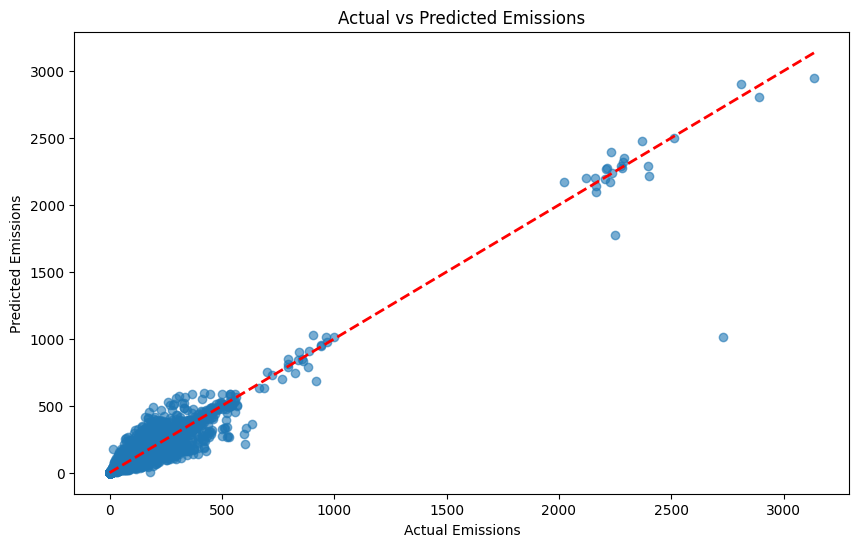

In [85]:
# Predict on the validation set using the trained Decision Tree Regressor
y_pred_dt = decision_tree_fit.predict(X_val)

# Evaluate the model
mse_dt = mean_squared_error(y_val, y_pred_dt)
r2_dt = r2_score(y_val, y_pred_dt)

print("Decision Tree Regressor")
print(f"Mean Squared Error (MSE): {mse_dt:.4f}")
print(f"R² Score: {r2_dt:.4f}")

# Optionally, you can plot the predicted vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_val, y_pred_dt, alpha=0.6)
plt.plot([y_val.min(), y_val.max()], [y_val.min(), y_val.max()], 'r--', lw=2)
plt.xlabel('Actual Emissions')
plt.ylabel('Predicted Emissions')
plt.title('Actual vs Predicted Emissions')
plt.show()

In [89]:
# Ensure all features are numeric in the test set
X_test_numeric = test_df[numeric_columns]

# Predict on the test set using the trained Decision Tree Regressor
test_predictions = decision_tree_fit.predict(X_test_numeric)

# Check the columns in the test_df to find an appropriate identifier column
print("Columns in test_df:", test_df.columns)

# If there is no 'ID' column, create an identifier column
if 'ID' not in test_df.columns:
    test_df['ID'] = range(1, len(test_df) + 1)

# Create a DataFrame to store the predictions
test_predictions_df = pd.DataFrame({
    'ID': test_df['ID'],  # Use the identifier column in the test set
    'Predicted_Emissions': test_predictions
})

# Display the first few rows of the predictions
test_predictions_df.head()


Columns in test_df: Index(['ID_LAT_LON_YEAR_WEEK', 'latitude', 'longitude', 'year', 'week_no', 'SulphurDioxide_SO2_column_number_density', 'SulphurDioxide_SO2_column_number_density_amf', 'SulphurDioxide_SO2_slant_column_number_density', 'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle', 'SulphurDioxide_sensor_zenith_angle', 'SulphurDioxide_solar_azimuth_angle', 'SulphurDioxide_solar_zenith_angle', 'SulphurDioxide_SO2_column_number_density_15km', 'CarbonMonoxide_CO_column_number_density', 'CarbonMonoxide_H2O_column_number_density', 'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_altitude', 'CarbonMonoxide_sensor_azimuth_angle', 'CarbonMonoxide_sensor_zenith_angle', 'CarbonMonoxide_solar_azimuth_angle', 'CarbonMonoxide_solar_zenith_angle', 'NitrogenDioxide_NO2_column_number_density', 'NitrogenDioxide_tropospheric_NO2_column_number_density', 'NitrogenDioxide_stratospheric_NO2_column_number_density', 'NitrogenDioxide_NO2_slant_column_number_density',
       'Nitr

,ID,Predicted_Emissions
0,1,4.26375
1,2,3.97181
2,3,4.27355
3,4,4.23363
4,5,4.39256


In [90]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_val, y_pred_dt)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_val, y_pred_dt)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

# Calculate R² Score
r2 = r2_score(y_val, y_pred_dt)

# Print the results
print("Accuracy of the Regression Model:")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

Accuracy of the Regression Model:
Mean Absolute Error (MAE): 9.7131
Mean Squared Error (MSE): 909.5607
Root Mean Squared Error (RMSE): 30.1589
R² Score: 0.9447


Accuracy of the Decision Tree Regressor (Binary Classification):
Accuracy: 0.9943


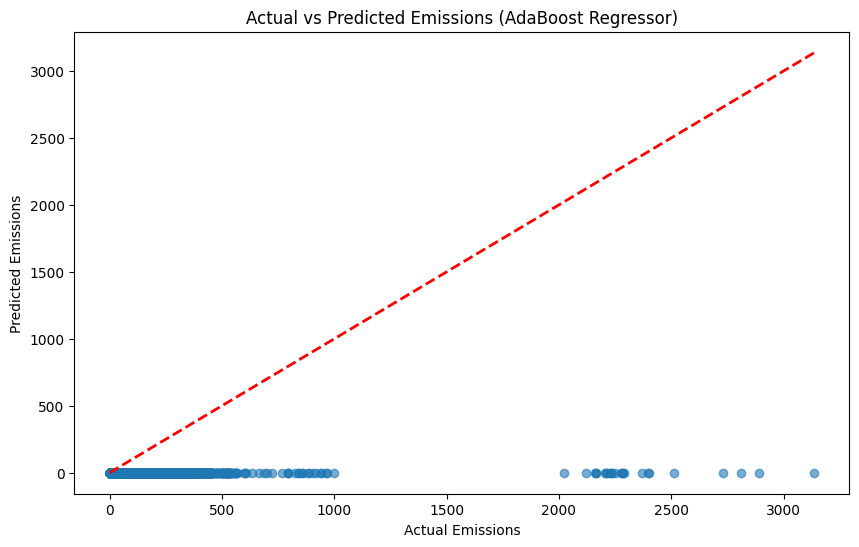

In [95]:
# Define a threshold to convert regression predictions to binary classification
threshold = 0.5  # Adjust the threshold based on your specific use case

# Convert the actual and predicted values to binary classification
y_val_class = (y_val > threshold).astype(int)
y_pred_class = (y_pred_dt > threshold).astype(int)

# Calculate the accuracy
accuracy = (y_val_class == y_pred_class).mean()

print("Accuracy of the Decision Tree Regressor (Binary Classification):")
print(f"Accuracy: {accuracy:.4f}")

# Optionally, you can plot the predicted vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_val, y_val_class, alpha=0.6)
plt.plot([y_val.min(), y_val.max()], [y_val.min(), y_val.max()], 'r--', lw=2)
plt.xlabel('Actual Emissions')
plt.ylabel('Predicted Emissions')
plt.title('Actual vs Predicted Emissions (AdaBoost Regressor)')
plt.show()

AdaBoost Regressor
Mean Squared Error (MSE): 7423.9037
R² Score: 0.5488


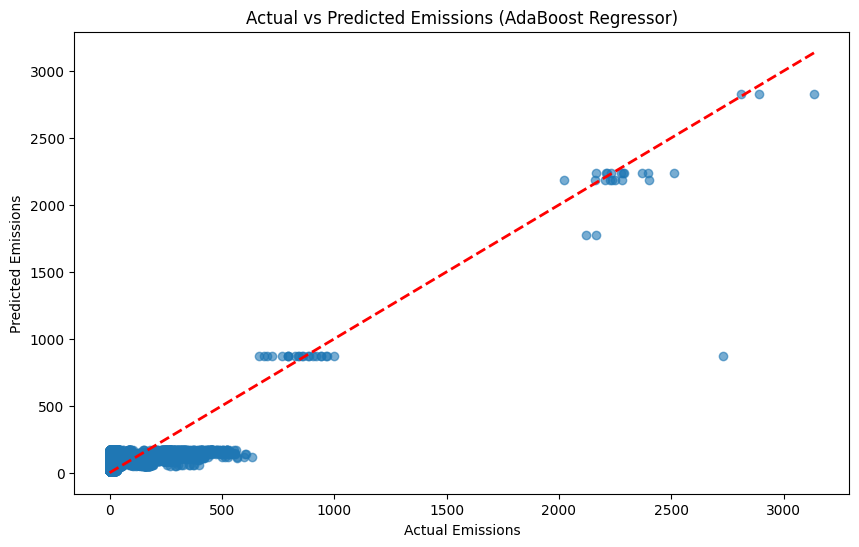

In [92]:
from sklearn.ensemble import AdaBoostRegressor

# Initialize the AdaBoost Regressor
ada_boost_reg = AdaBoostRegressor()

# Train the model on the training set
ada_boost_reg.fit(X_train_numeric, y_train)

# Predict on the validation set
y_pred_ab = ada_boost_reg.predict(X_val)

# Evaluate the model
mse_ab = mean_squared_error(y_val, y_pred_ab)
r2_ab = r2_score(y_val, y_pred_ab)

print("AdaBoost Regressor")
print(f"Mean Squared Error (MSE): {mse_ab:.4f}")
print(f"R² Score: {r2_ab:.4f}")

# Optionally, you can plot the predicted vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_val, y_pred_ab, alpha=0.6)
plt.plot([y_val.min(), y_val.max()], [y_val.min(), y_val.max()], 'r--', lw=2)
plt.xlabel('Actual Emissions')
plt.ylabel('Predicted Emissions')
plt.title('Actual vs Predicted Emissions (AdaBoost Regressor)')
plt.show()

CatBoost Regressor
Mean Squared Error (MSE): 758.7854
R² Score: 0.9539


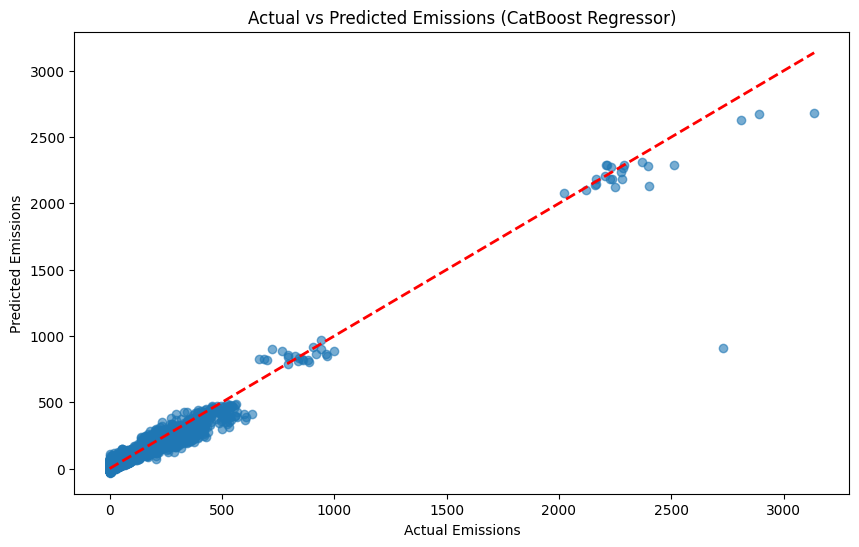

In [94]:
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Initialize the CatBoost Regressor
catboost_reg = CatBoostRegressor(verbose=0)

# Train the model on the training set
catboost_reg.fit(X_train_numeric, y_train)

# Predict on the validation set
y_pred_cb = catboost_reg.predict(X_val)

# Evaluate the model
mse_cb = mean_squared_error(y_val, y_pred_cb)
r2_cb = r2_score(y_val, y_pred_cb)

print("CatBoost Regressor")
print(f"Mean Squared Error (MSE): {mse_cb:.4f}")
print(f"R² Score: {r2_cb:.4f}")

# Optionally, you can plot the predicted vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_val, y_pred_cb, alpha=0.6)
plt.plot([y_val.min(), y_val.max()], [y_val.min(), y_val.max()], 'r--', lw=2)
plt.xlabel('Actual Emissions')
plt.ylabel('Predicted Emissions')
plt.title('Actual vs Predicted Emissions (CatBoost Regressor)')
plt.show()

The prediction with the best accuraccy model is the catboost as shown in the graph

In [96]:
# Drop the ID_LAT_LON_YEAR_WEEK column from the test data
X_test = test_df.drop(columns=["ID_LAT_LON_YEAR_WEEK"])

# Ensure all features are numeric in the test set
X_test_numeric = X_test.select_dtypes(include=[np.number])

# Predict on the test set using the trained CatBoost Regressor
test_predictions_cb = catboost_reg.predict(X_test_numeric)

# Create a DataFrame to store the predictions
test_predictions_cb_df = pd.DataFrame({
    'ID': test_df['ID'],  # Use the identifier column in the test set
    'Predicted_Emissions': test_predictions_cb
})

# Display the first few rows of the predictions
test_predictions_cb_df.head()

,ID,Predicted_Emissions
0,1,-18.24594
1,2,-1.94510
2,3,4.30833
3,4,-3.09465
4,5,-8.41641


In [98]:
# Replace the ID with the data from the ID_LAT_LON_YEAR_WEEK column
test_predictions_cb_df['ID'] = test_df['ID_LAT_LON_YEAR_WEEK']

# Save the predictions to a CSV file
test_predictions_cb_df.to_csv('submission.csv', index=False)

print("Predictions saved to submission.csv")

Predictions saved to submission.csv
